In [8]:
!nvidia-smi

Mon Apr 15 17:06:16 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A5000               On  | 00000000:01:00.0 Off |                  Off |
| 30%   32C    P8               9W / 230W |  24230MiB / 24564MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### Necessary Libraries

In [9]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

In [2]:
# Data Processing
import numpy as np
import pandas as pd
import warnings
import pickle
import scipy.io
from sklearn.model_selection import train_test_split

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msn
from mpl_toolkits.mplot3d import Axes3D

# PyTorch
import torch
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.tuner import Tuner
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import MAE, SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
from pytorch_forecasting.data.encoders import NaNLabelEncoder
import logging

# Tensorflow
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile

# Operating System
import copy

# Las file
import lasio as las

import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import random
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

2024-04-17 18:31:42.996559: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 18:31:42.996601: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 18:31:42.996627: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 18:31:43.002801: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 18:31:43.632670: W tensorflow/compiler/

### Code Reproducibility and Logging Directory

In [2]:
pl.seed_everything(123)

Global seed set to 123


123

In [3]:
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

In [4]:
cd "/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Lightning_Inventory/North Sea/NPHI/"

/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Lightning_Inventory/North Sea/NPHI


### Data Preprocessing

In [7]:
# Define an empty list to store the names of .las files
las_file_list = []

# Define the path to the directory containing the .las files
path = "/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Inputs/North Sea/las_files_Lithostrat_data/"

# View the contents of the path
files = os.listdir(path)

# Iterate through all files in the directory
for filename in files:
    # Check if the file name ends with '.las' (case-insensitive)
    if filename.lower().endswith('.las'):
        # If it does, append the full file path to the list
        las_file_list.append(path + filename)

# Now, las_file_list contains the full paths of all .las files in the directory

In [8]:
# Create an empty list to store the DataFrames
df_list = []

# Initialize a counter
counter = 0

# Iterate through all the files contained in "las_file_list"
for lasfile in las_file_list[:]:
    # Read the LAS file using lasio
    las_df = las.read(lasfile)

    # Convert LAS data to a DataFrame
    lasdf = las_df.df()

    try:
        # Try to access the WELL value in the LAS file
        well_info = las_df.well.WELL.value

            # Add the WELL and DEPTH columns to the DataFrame
        lasdf['WELL'] = well_info
        lasdf['DEPTH'] = lasdf.index

        # Append the converted DataFrame to the list
        df_list.append(lasdf)

    except AttributeError:
      pass

    # Increment the counter
    counter += 1  # You can uncomment this line if needed

In [9]:
# concatenating to a single dataframe
wells_single_df = pd.concat(df_list, sort=True)

# visualising the single dataframe created
wells_single_df

,BS,CALI,DCAL,DEPTH,DEPTH_MD,DRHO,DTC,DTS,FORCE_2020_LITHOFACIES_CONFIDENCE,FORCE_2020_LITHOFACIES_LITHOLOGY,...,ROP,ROPA,RSHA,RXO,SGR,SP,WELL,X_LOC,Y_LOC,Z_LOC
DEPT,,,,,,,,,,,,,,,,,,,,,
307.695587,NaN,NaN,NaN,307.695587,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,35/9-5,NaN,NaN,NaN
307.847587,NaN,NaN,NaN,307.847587,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,35/9-5,NaN,NaN,NaN
307.999587,NaN,NaN,NaN,307.999587,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,35/9-5,NaN,NaN,NaN
308.151587,NaN,NaN,NaN,308.151587,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,35/9-5,NaN,NaN,NaN
308.303587,NaN,NaN,NaN,308.303587,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,35/9-5,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3161.583790,8.5,NaN,NaN,3161.583790,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,16/10-1 Alpha,NaN,NaN,NaN
3161.735790,8.5,NaN,NaN,3161.735790,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,16/10-1 Alpha,NaN,NaN,NaN
3161.887790,8.5,NaN,NaN,3161.887790,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,16/10-1 Alpha,NaN,NaN,NaN


In [10]:
# Saves and loads the dataframe as a CSV file
wells_single_df.to_csv('/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/NorthSea_wells_single_df.csv', index=False)  # Set index=False to exclude the index column
wells_single_df = pd.read_csv('/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/NorthSea_wells_single_df.csv')

In [11]:
# summary statistics of the dataset
wells_single_df.describe()

,BS,CALI,DCAL,DEPTH,DEPTH_MD,DRHO,DTC,DTS,FORCE_2020_LITHOFACIES_CONFIDENCE,FORCE_2020_LITHOFACIES_LITHOLOGY,...,RMIC,ROP,ROPA,RSHA,RXO,SGR,SP,X_LOC,Y_LOC,Z_LOC
count,1.456879e+06,1.461913e+06,384238.000000,2.337639e+06,2.221893e+06,1.324910e+06,1.793708e+06,388821.000000,1.444053e+06,1.431383e+06,...,238377.000000,1.220926e+06,738753.000000,868460.000000,386207.000000,72163.000000,1.228770e+06,2.221893e+06,2.221893e+06,2.221893e+06
mean,1.377952e+01,1.323380e+01,16.402556,1.876127e+03,1.920035e+03,2.144688e-02,1.167707e+02,221.196730,1.153701e+00,6.142501e+04,...,9.230063,3.268063e+02,36.193849,9.953705,-100.804748,62.730798,4.148588e+01,4.850926e+05,6.691335e+06,-1.873012e+03
std,5.013730e+00,3.714703e+00,394.248043,1.062783e+03,1.043475e+03,6.460572e+00,3.185958e+01,81.475537,4.331476e-01,1.397315e+04,...,106.653605,3.022932e+03,84.974114,96.699936,364.144671,52.769761,1.685852e+02,3.556914e+04,1.356244e+05,1.015253e+03
min,6.000000e+00,2.340806e+00,-23.199656,4.880000e-02,9.872000e+01,-7.429339e+03,0.000000e+00,69.163177,1.000000e+00,3.000000e+04,...,0.056586,-2.149578e+01,-999.250122,0.000100,-999.900024,-983.000000,-4.498991e+03,4.232375e+05,6.406641e+06,-5.435889e+03
25%,9.875000e+00,9.893431e+00,0.099748,1.006690e+03,1.073806e+03,-8.000000e-03,9.061468e+01,160.311493,1.000000e+00,6.500000e+04,...,0.883667,1.109909e+01,15.052600,0.835767,0.663425,42.073429,2.738810e+01,4.544695e+05,6.571042e+06,-2.603980e+03
50%,1.225000e+01,1.256316e+01,0.468299,1.764242e+03,1.806484e+03,3.399393e-03,1.157896e+02,200.151916,1.000000e+00,6.500000e+04,...,1.638852,2.562489e+01,25.744751,1.344424,1.335758,68.817604,5.144053e+01,4.787689e+05,6.758510e+06,-1.771354e+03
75%,1.750000e+01,1.649786e+01,1.186321,2.624239e+03,2.649615e+03,2.533596e-02,1.438757e+02,258.840820,1.000000e+00,6.500000e+04,...,4.096697,4.305305e+01,38.867996,2.606366,3.186819,87.497753,7.660505e+01,5.201532e+05,6.798584e+06,-1.047976e+03
max,4.200000e+01,3.211106e+01,10023.759766,5.479040e+03,5.477672e+03,4.983452e+01,3.204789e+02,724.536194,3.000000e+00,9.900000e+04,...,10000.000000,9.242916e+04,3989.174316,2193.904541,35930.671875,963.608582,5.265473e+02,5.726328e+05,6.856661e+06,-7.265216e+01


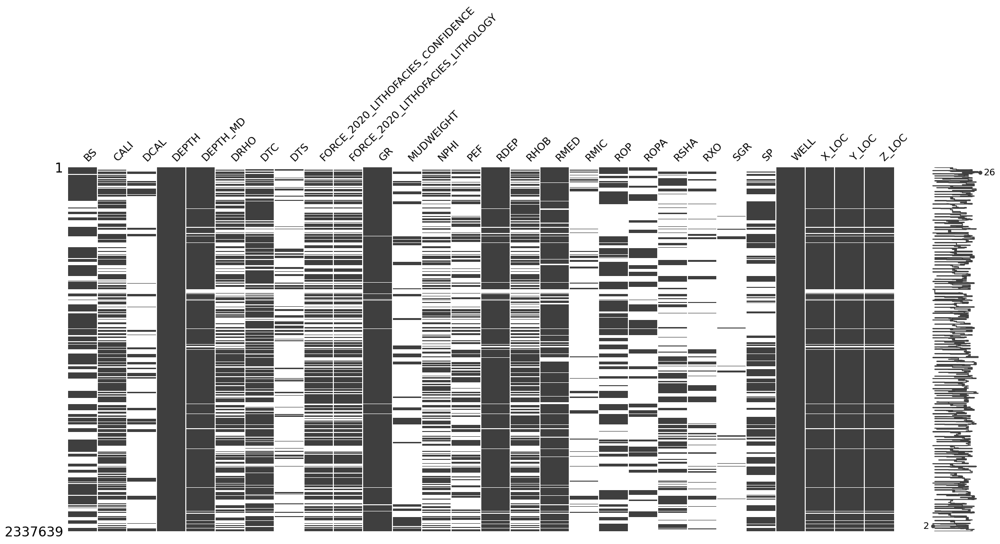

In [12]:
# Visualise the dataset to view missing points
msn.matrix(wells_single_df);

In [13]:
# Drops the missing point from selected well log
wells_single_df.dropna(subset=['RHOB', 'SP', 'NPHI', 'GR', 'DTC'], inplace=True)

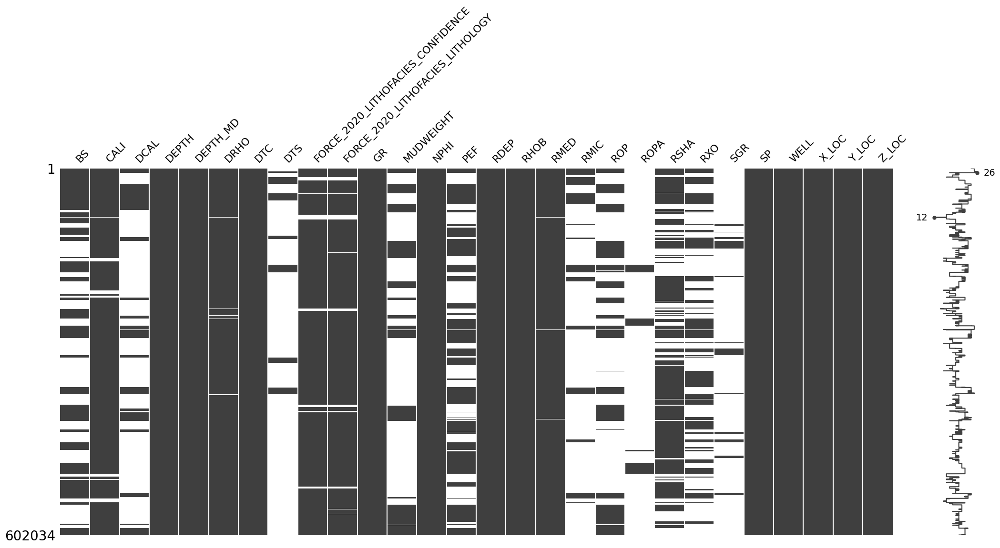

In [14]:
# Visualises the wells to ensure all misssing points have been dropped
msn.matrix(wells_single_df);

In [15]:
# Provides the total number of wells within the dataset
len(wells_single_df["WELL"].unique())

72

In [16]:
# Initialize an empty list to store depth values
depth = []

# Initialize a counter variable to keep track of the depth index
counter = 0

# Iterate through the index of 'wells_single_df' DataFrame
for _ in wells_single_df.index:
    # Append the current depth value (counter + 1) to the 'depth' list
    depth.append(counter + 1)

    # Increment the counter by 1
    counter += 1

# Print the 'depth' list (optional)
# print(depth)

# Assign the 'depth' list to the 'Depth' column of 'wells_single_df' DataFrame
wells_single_df['Depth'] = depth

In [17]:
wells_single_df

,BS,CALI,DCAL,DEPTH,DEPTH_MD,DRHO,DTC,DTS,FORCE_2020_LITHOFACIES_CONFIDENCE,FORCE_2020_LITHOFACIES_LITHOLOGY,...,ROPA,RSHA,RXO,SGR,SP,WELL,X_LOC,Y_LOC,Z_LOC,Depth
27129,12.250001,12.678927,0.428931,1174.00640,1174.006348,0.018848,135.261261,NaN,1.0,65000.0,...,NaN,1.494266,0.968572,NaN,-254.782455,25/8-5 S Jotun,463972.21875,6591330.0,-1148.948486,1
27130,12.250001,12.664779,0.414780,1174.15840,1174.158447,0.009240,135.017532,NaN,1.0,65000.0,...,NaN,1.542279,0.959940,NaN,-256.119049,25/8-5 S Jotun,463972.21875,6591330.0,-1149.100586,2
27131,12.250001,12.638149,0.388151,1174.31040,1174.310425,0.001183,132.559067,NaN,1.0,65000.0,...,NaN,1.615183,0.975309,NaN,-256.510651,25/8-5 S Jotun,463972.21875,6591330.0,-1149.252563,3
27132,12.250001,12.630744,0.380743,1174.46240,1174.462402,-0.001701,129.148376,NaN,1.0,65000.0,...,NaN,1.681457,1.001541,NaN,-255.809814,25/8-5 S Jotun,463972.21875,6591330.0,-1149.404541,4
27133,12.250001,12.648331,0.398328,1174.61440,1174.614380,-0.001738,126.443634,NaN,1.0,65000.0,...,NaN,1.706447,0.973404,NaN,-255.106827,25/8-5 S Jotun,463972.21875,6591330.0,-1149.556519,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2337535,8.500000,13.860578,5.360577,3146.53579,3146.535889,0.026272,68.172493,NaN,2.0,NaN,...,NaN,NaN,NaN,NaN,16.417650,16/10-1 Alpha,444187.78125,6435599.0,-3119.725830,602030
2337536,8.500000,13.988312,5.488312,3146.68779,3146.687744,0.010294,68.095314,NaN,3.0,NaN,...,NaN,NaN,NaN,NaN,16.067318,16/10-1 Alpha,444187.78125,6435599.0,-3119.877441,602031
2337537,8.500000,14.378875,5.878875,3146.83979,3146.839844,-0.000845,68.088066,NaN,3.0,NaN,...,NaN,NaN,NaN,NaN,15.324245,16/10-1 Alpha,444187.78125,6435599.0,-3120.028809,602032
2337538,8.500000,15.052133,6.552133,3146.99179,3146.991699,-0.005821,68.345970,NaN,3.0,NaN,...,NaN,NaN,NaN,NaN,14.512121,16/10-1 Alpha,444187.81250,6435599.0,-3120.180420,602033


In [18]:
# Creates a processed dataframe
wells = wells_single_df[["SP", "RHOB", "NPHI", "GR", "Depth", "WELL", "DEPTH", "DTC"]]

In [19]:
wells

,SP,RHOB,NPHI,GR,Depth,WELL,DEPTH,DTC
27129,-254.782455,2.165123,0.679578,85.495544,1,25/8-5 S Jotun,1174.00640,135.261261
27130,-256.119049,2.131932,0.639480,85.272270,2,25/8-5 S Jotun,1174.15840,135.017532
27131,-256.510651,2.118546,0.616784,86.180878,3,25/8-5 S Jotun,1174.31040,132.559067
27132,-255.809814,2.121543,0.617849,86.217583,4,25/8-5 S Jotun,1174.46240,129.148376
27133,-255.106827,2.130758,0.622054,87.868965,5,25/8-5 S Jotun,1174.61440,126.443634
...,...,...,...,...,...,...,...,...
2337535,16.417650,1.971565,-0.006601,10.986899,602030,16/10-1 Alpha,3146.53579,68.172493
2337536,16.067318,1.926571,-0.001114,11.458970,602031,16/10-1 Alpha,3146.68779,68.095314
2337537,15.324245,1.845662,0.009185,11.364380,602032,16/10-1 Alpha,3146.83979,68.088066
2337538,14.512121,1.771778,0.040532,12.820768,602033,16/10-1 Alpha,3146.99179,68.345970


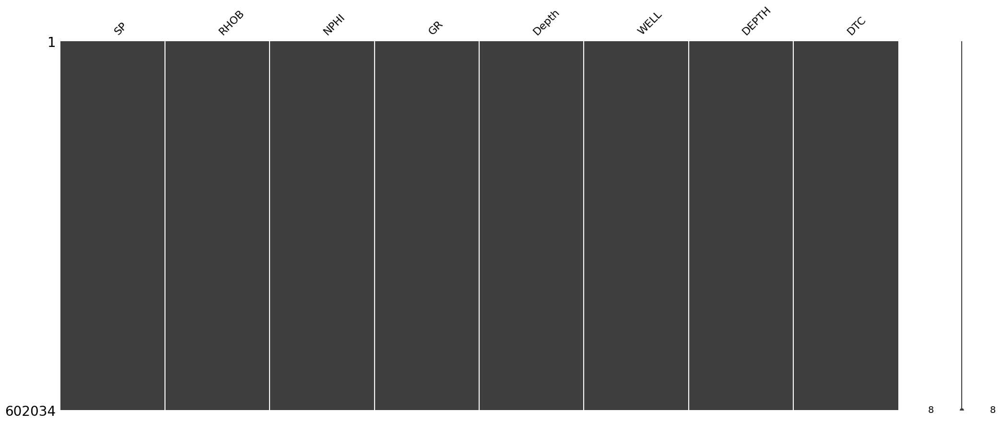

In [20]:
msn.matrix(wells);

In [21]:
# Checks for missing datapoints in each individual log
print(wells['GR'].isna().any(), 
      wells['NPHI'].isna().any(),
      wells['RHOB'].isna().any(),
      wells['SP'].isna().any(),
      wells['DTC'].isna().any())


False False False False False


### Training and Testing Data Split

In [22]:
# eliminates wells less than twice the length of max_encoder + max_prediction
category_counts = wells['WELL'].value_counts()
categories_to_keep = category_counts[category_counts >= 320].index
filtered_wells = wells[wells['WELL'].isin(categories_to_keep)]

# Group the DataFrame by the 'WELL' column, retrieves the last 160 for each well for testing
grouped = filtered_wells.groupby('WELL')
train_wells = grouped.apply(lambda x: x.iloc[:-160])#.reset_index(drop=True, inplace=True)
test_wells = grouped.apply(lambda x: x.iloc[-160:])#.reset_index(drop=True, inplace=True)

In [23]:
train_wells.reset_index(drop=True, inplace=True)
train_wells

,SP,RHOB,NPHI,GR,Depth,WELL,DEPTH,DTC
0,45.547737,1.774626,0.765867,55.892757,131672,15/9-13 Sleipner East Appr,1138.7040,147.837677
1,45.914387,1.800986,0.800262,60.929138,131673,15/9-13 Sleipner East Appr,1138.8560,142.382431
2,46.039104,1.817696,0.765957,62.117264,131674,15/9-13 Sleipner East Appr,1139.0080,138.258331
3,46.826984,1.829333,0.702521,61.010860,131675,15/9-13 Sleipner East Appr,1139.1600,139.198914
4,46.950382,1.813854,0.639708,58.501236,131676,15/9-13 Sleipner East Appr,1139.3120,144.290085
...,...,...,...,...,...,...,...,...
590622,18.426376,2.363251,0.220816,32.588402,215751,7/1-1,2777.8648,90.283432
590623,18.931366,2.361948,0.217980,33.245884,215752,7/1-1,2778.0168,89.803383
590624,19.003574,2.354167,0.209165,32.832748,215753,7/1-1,2778.1688,88.903961
590625,18.915771,2.343990,0.198136,32.023933,215754,7/1-1,2778.3208,87.848991


In [24]:
test_wells.reset_index(drop=True, inplace=True)
test_wells

,SP,RHOB,NPHI,GR,Depth,WELL,DEPTH,DTC
0,145.439362,2.482669,0.303956,99.196007,145467,15/9-13 Sleipner East Appr,3235.5440,83.356712
1,145.353851,2.508899,0.305738,97.385094,145468,15/9-13 Sleipner East Appr,3235.6960,81.881187
2,145.313797,2.502994,0.319538,93.358948,145469,15/9-13 Sleipner East Appr,3235.8480,81.994858
3,145.507797,2.474022,0.309425,95.631813,145470,15/9-13 Sleipner East Appr,3236.0000,81.621078
4,145.411911,2.462878,0.319349,95.764404,145471,15/9-13 Sleipner East Appr,3236.1520,81.775070
...,...,...,...,...,...,...,...,...
11195,20.476349,2.390176,0.175311,33.500996,215911,7/1-1,2802.1848,88.450577
11196,20.555651,2.392071,0.183708,34.161476,215912,7/1-1,2802.3368,87.788620
11197,20.653856,2.393809,0.192190,34.818180,215913,7/1-1,2802.4888,87.176483
11198,21.313562,2.391099,0.203516,35.330578,215914,7/1-1,2802.6408,87.959618


# Temporal Fusion Transformers

### Hyperparameters

In [25]:
# Initial hyperparameters
batch_size = 100
heads = 6
hidden_sizes = 360
learning_rate = 0.0001
gradient_clipping = 0.1
max_prediction_length = 20
max_encoder_length = 7 * 20
max_epoch = 200
drop_out = 0.1

### TFT Dataloader

In [26]:
# Create a TimeSeriesDataSet for training data
training = TimeSeriesDataSet(
    train_wells,  # Training data
    time_idx="Depth",  # Time index column
    target="NPHI",  # Target column
    group_ids=['WELL'],  # Group IDs if any
    min_encoder_length=max_encoder_length // 2,  # Minimum encoder length
    max_encoder_length=max_encoder_length,  # Maximum encoder length
    min_prediction_length=20,  # Minimum prediction length
    max_prediction_length=max_prediction_length,  # Maximum prediction length
    static_categoricals=['WELL'],  # Static categorical features if any
    time_varying_known_reals=["SP", "DTC", "GR","DEPTH", "RHOB"],  # Time-varying known real features if any
    time_varying_unknown_reals=['NPHI'],  # Time-varying unknown real features
    add_relative_time_idx=True,  # Add relative time index
    add_encoder_length=True,  # Add encoder length
    allow_missing_timesteps=True, # Accommodates potential missing timesteps
    categorical_encoders={'WELL': NaNLabelEncoder(add_nan=True)}
)

In [27]:
# Create a validation and testing dataset 
validation = TimeSeriesDataSet.from_dataset(training, train_wells, predict=True, stop_randomization=True)
testing = TimeSeriesDataSet.from_dataset(training, test_wells, predict=True, stop_randomization=True)

# Create a dataloader
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=32)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=32)
test_dataloader = testing.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=32)

In [28]:
training.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
0,131672,145466,1,0,131672,13795,0,159,160
1,131672,145466,1,1,131673,13795,0,160,160
2,131672,145466,1,2,131674,13795,0,161,160
3,131672,145466,1,3,131675,13795,0,162,160
4,131672,145466,1,4,131676,13795,0,163,160
...,...,...,...,...,...,...,...,...,...
595522,211533,215755,1,586404,211533,4223,69,586558,155
595523,211533,215755,1,586404,211533,4223,69,586559,156
595524,211533,215755,1,586404,211533,4223,69,586560,157
595525,211533,215755,1,586404,211533,4223,69,586561,158


In [29]:
validation.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
13635,131672,145466,1,13635,145307,13795,0,13794,160
33708,563074,583146,1,33708,582987,20073,1,33867,160
47030,265020,278341,1,47030,278182,13322,2,47189,160
60019,118523,131511,1,60019,131352,12989,3,60178,160
61502,145627,147109,1,61502,146950,1483,4,61661,160
...,...,...,...,...,...,...,...,...,...
568751,310166,323089,1,568751,322930,12924,65,568910,160
575877,515250,522375,1,575877,522216,7126,66,576036,160
582957,177994,185073,1,582957,184914,7080,67,583116,160
586244,112505,115791,1,586244,115632,3287,68,586403,160


In [30]:
testing.index

,time_first,time_last,time_diff_to_next,index_start,time,count,sequence_id,index_end,sequence_length
0,145467,145626,1,0,145467,160,0,159,160
160,583147,583306,1,160,583147,160,1,319,160
320,278342,278501,1,320,278342,160,2,479,160
480,131512,131671,1,480,131512,160,3,639,160
640,147110,147269,1,640,147110,160,4,799,160
...,...,...,...,...,...,...,...,...,...
10400,323090,323249,1,10400,323090,160,65,10559,160
10560,522376,522535,1,10560,522376,160,66,10719,160
10720,185074,185233,1,10720,185074,160,67,10879,160
10880,115792,115951,1,10880,115792,160,68,11039,160


### TFT Model

In [31]:
# Defines a custom class call back to retrieve loss values

class MetricsCallback(pl.Callback):
    """PyTorch Lightning metric callback."""

    def __init__(self):
        super().__init__()
        self.metrics = []

    def on_validation_epoch_end(self, trainer, pl_module):
        metric = copy.deepcopy(trainer.callback_metrics)
        self.metrics.append(metric)

In [32]:
# Instantiates the class
metrics_callback = MetricsCallback()

In [33]:
warnings.filterwarnings("ignore")

# Define the Early Stopping callback
early_stop_callback = EarlyStopping(
    monitor="val_loss",
    min_delta=1e-5,
    patience=10,
    verbose=True,
    mode="min"
)

# Define the Learning Rate Monitor callback
lr_logger = LearningRateMonitor()

# Define the TensorBoard Logger
logger = TensorBoardLogger("lightning_logs")

# Define the Trainer configuration
trainer = pl.Trainer(
    max_epochs=max_epoch,
    accelerator='gpu',  # Use GPU acceleration
    devices=1,  # Number of GPUs to use
    enable_model_summary=True,  # Enable model summary
    gradient_clip_val=gradient_clipping,  # Gradient clipping value
    callbacks=[lr_logger, early_stop_callback, metrics_callback],  # Callbacks to use during training
    logger=logger  # Logger for tracking training progress
)

# Create the Temporal Fusion Transformer model
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=learning_rate,
    hidden_size=hidden_sizes,
    attention_head_size=heads,
    dropout=drop_out,
    hidden_continuous_size=hidden_sizes,
    output_size=7,  # Number of quantiles (default: [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 0.98])
    loss=QuantileLoss(),  # Loss function to use
    log_interval=10,  # Logging interval
    reduce_on_plateau_patience=4  # Patience for reducing learning rate on plateau
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


### Model Training

In [34]:
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

You are using a CUDA device ('NVIDIA RTX A5000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 1.2 K 
3  | prescalers                         | ModuleDict                      | 5.8 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 523 K 
5  | encoder_variable_selection         | VariableSelec

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: 0.015


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: 0.012


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.011


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.010


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.010


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.009


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.009


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 1e-05. New best score: 0.008


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.008


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.007


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.006


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.005


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.004


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.003


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.000 >= min_delta = 1e-05. New best score: 0.002


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 10 records. Best score: 0.002. Signaling Trainer to stop.


In [39]:
train_loss = []
validation_loss = []
for index in range(len(metrics_callback.metrics)):
  try:
    train_loss.append(float(metrics_callback.metrics[index]['train_loss']))
    validation_loss.append(float(metrics_callback.metrics[index]['val_loss']))

  except:
    pass

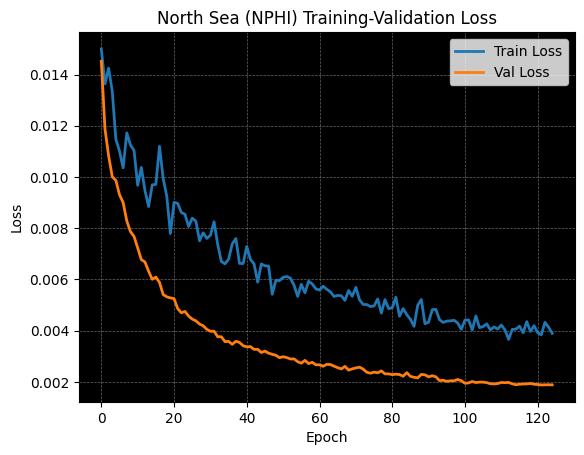

In [62]:
# Create a new figure with a dark background
fig, ax = plt.subplots()
fig.set_facecolor('white')
ax.set_facecolor('black')

plt.plot(train_loss, linewidth=2, label= "Train Loss");
plt.plot(validation_loss, linewidth=2, label = "Val Loss")

# Add labels to x-axis and y-axis (customize as needed)
ax.set_xlabel("Epoch", color='black')
ax.set_ylabel("Loss", color='black')

# Customize other plot properties (title, grid, etc.)
ax.set_title("North Sea (NPHI) Training-Validation Loss", color='black', fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)

# Customize tick labels and colors
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')

plt.legend(loc="upper right")

plt.savefig("/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Images/North Sea/NPHI/North Sea NPHI Loss.pdf", format="pdf", bbox_inches="tight") # Saves the figure


# Show the plot
plt.show()

In [41]:
warnings.filterwarnings("ignore")
best_model_path = trainer.checkpoint_callback.best_model_path
print(best_model_path)
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path) #loads the model

lightning_logs/lightning_logs/version_1/checkpoints/epoch=124-step=736500.ckpt


In [42]:
#zip and download the model
!zip  -r '/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Models/NorthSea_Welllog_[NPHI].zip' lightning_logs/lightning_logs/version_1/*

  adding: lightning_logs/lightning_logs/version_1/736500/ (stored 0%)
  adding: lightning_logs/lightning_logs/version_1/736500/WELL/ (stored 0%)
  adding: lightning_logs/lightning_logs/version_1/736500/WELL/tensors.tsv (deflated 51%)
  adding: lightning_logs/lightning_logs/version_1/736500/WELL/metadata.tsv (deflated 53%)
  adding: lightning_logs/lightning_logs/version_1/checkpoints/ (stored 0%)
  adding: lightning_logs/lightning_logs/version_1/checkpoints/epoch=124-step=736500.ckpt (deflated 8%)
  adding: lightning_logs/lightning_logs/version_1/events.out.tfevents.1701481167.76-2223-03.400429.0 (deflated 12%)
  adding: lightning_logs/lightning_logs/version_1/hparams.yaml (deflated 89%)
  adding: lightning_logs/lightning_logs/version_1/projector_config.pbtxt (deflated 36%)


In [35]:
#load our saved model again
!unzip -o '/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Models/NorthSea_Welllog_[NPHI].zip'
best_model_path='lightning_logs/lightning_logs/version_1/checkpoints/epoch=124-step=736500.ckpt'
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

Archive:  /home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Models/NorthSea_Welllog_[NPHI].zip
  inflating: lightning_logs/lightning_logs/version_1/736500/WELL/tensors.tsv  
  inflating: lightning_logs/lightning_logs/version_1/736500/WELL/metadata.tsv  
  inflating: lightning_logs/lightning_logs/version_1/checkpoints/epoch=124-step=736500.ckpt  
  inflating: lightning_logs/lightning_logs/version_1/events.out.tfevents.1701481167.76-2223-03.400429.0  
  inflating: lightning_logs/lightning_logs/version_1/hparams.yaml  
  inflating: lightning_logs/lightning_logs/version_1/projector_config.pbtxt  


### Validation Evaluation

In [43]:
warnings.filterwarnings("ignore")

actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader,trainer_kwargs=dict(accelerator="cpu"))

#average p50 loss overall
print((actuals - predictions).abs().mean().item())
#average p50 loss per time series
print((actuals - predictions).abs().mean(axis=1))

0.003082946641370654
tensor([0.0029, 0.0032, 0.0016, 0.0022, 0.0021, 0.0061, 0.0027, 0.0019, 0.0029,
        0.0031, 0.0020, 0.0025, 0.0030, 0.0038, 0.0033, 0.0012, 0.0027, 0.0034,
        0.0034, 0.0027, 0.0026, 0.0033, 0.0027, 0.0021, 0.0017, 0.0051, 0.0028,
        0.0063, 0.0033, 0.0040, 0.0032, 0.0027, 0.0028, 0.0025, 0.0038, 0.0062,
        0.0025, 0.0056, 0.0025, 0.0025, 0.0035, 0.0042, 0.0014, 0.0042, 0.0018,
        0.0031, 0.0034, 0.0056, 0.0037, 0.0024, 0.0022, 0.0019, 0.0050, 0.0017,
        0.0030, 0.0027, 0.0015, 0.0040, 0.0014, 0.0029, 0.0023, 0.0028, 0.0039,
        0.0024, 0.0033, 0.0047, 0.0013, 0.0047, 0.0035, 0.0023])


In [59]:
warnings.filterwarnings("ignore")
trainer.test(best_tft,val_dataloader);

Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │   0.003082128707319498    │
│         test_MAPE         │   0.017380164936184883    │
│         test_RMSE         │   0.0041439225897192955   │
│        test_SMAPE         │    0.01794065721333027    │
│         test_loss         │   0.0018844295991584659   │
└───────────────────────────┴───────────────────────────┘

In [36]:
def pred_plot_df(well_name, well=train_wells, pred_data=validation, tft_model=best_tft, accelerator="cpu"):

    # Creates a dataframe containing just the selected well
    well_df  = well[well["WELL"] == well_name]

    # Creates the new index for the observed values and values to be predicted: Uses 160 because the encoder length is set to 140, plus the max_prediction of 20 totals 160
    values = well_df["DEPTH"].tolist()
    observed_idx = values[-160:]
    pred_idx = values[-20:]

    # Prepares the observed data for plotting
    new_well_df = well_df.iloc[-160:].copy()
    new_well_df["Depth index"] = observed_idx
    new_well_df.set_index("Depth index", inplace=True)

    # Conducts the prediction 
    single_pred =best_tft.predict(pred_data.filter(lambda x: (x.WELL == well_name)),
                                  mode="raw",
                                  trainer_kwargs=dict(accelerator=accelerator), 
                                  return_x=True, 
                                  return_y=True)

    # Retrieves the predicted output and converts to dataframe for plotting 
    pred_data = single_pred.output.prediction[:, :, 4][0]  # [:, :, 4] 4 was used because we're interested in the 50th quantile
    pred_df = pd.DataFrame(pred_data.numpy())
    pred_df["pred_index"] = pred_idx
    pred_df.set_index("pred_index", inplace=True)
    pred_df

    return new_well_df, pred_df, pred_idx

In [46]:
# Gets the number of unique wells
train_wells_len = len(train_wells['WELL'].unique())
print(train_wells_len)

# Retrieves a list of the well names
well_names_list = train_wells['WELL'].unique()
well_names_list[12]

70


'17/11-1'

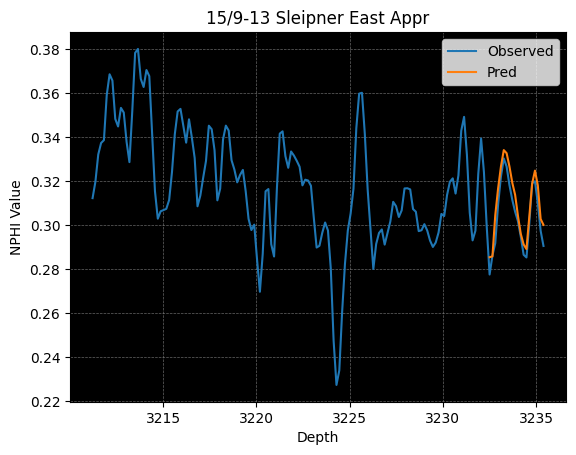

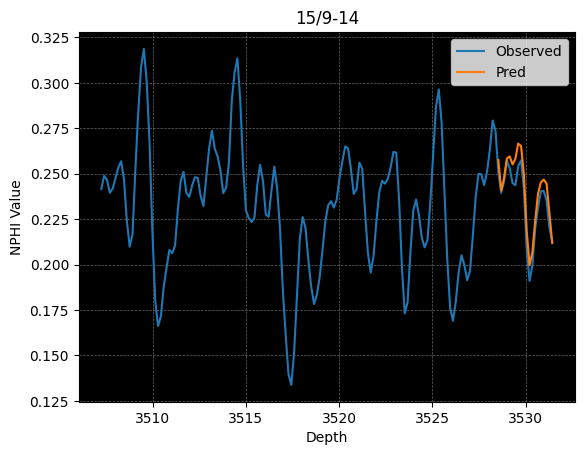

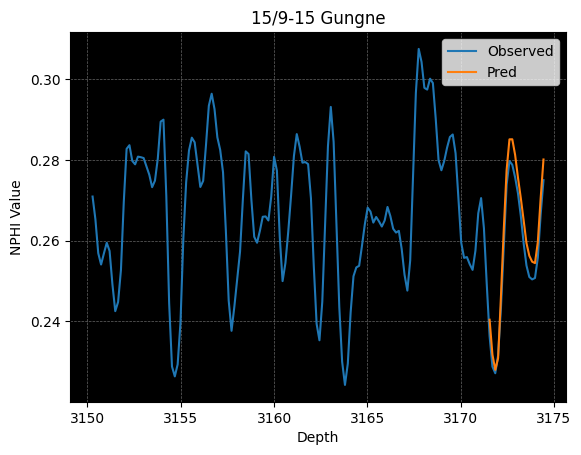

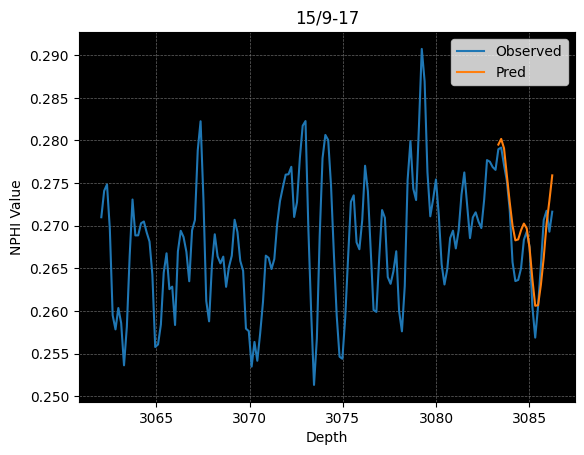

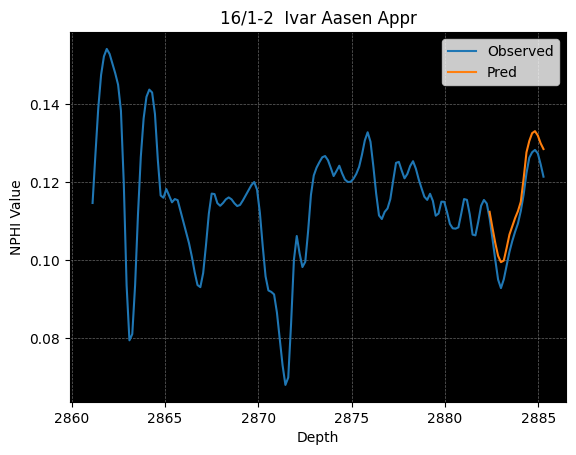

...

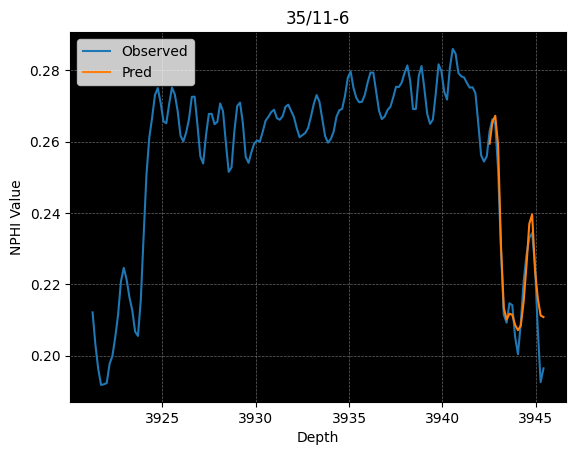

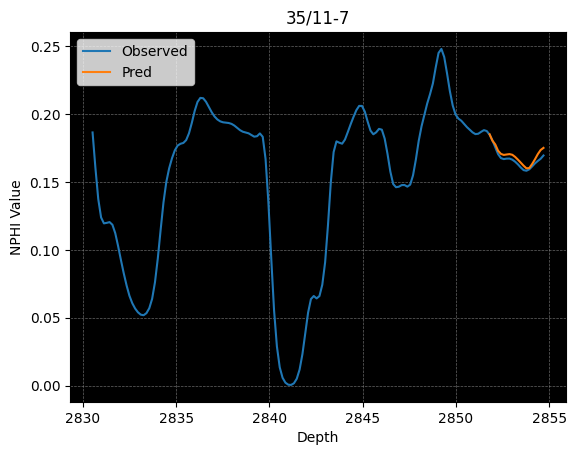

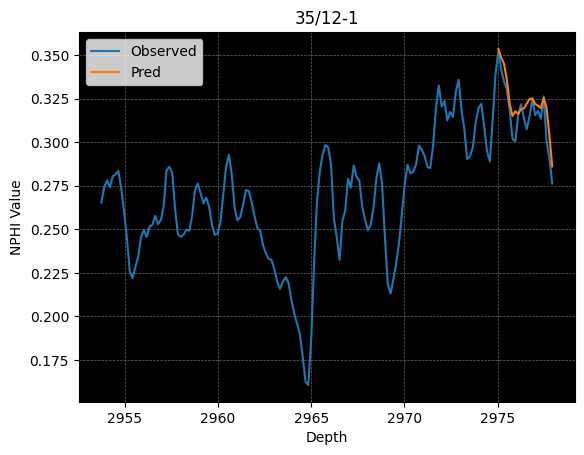

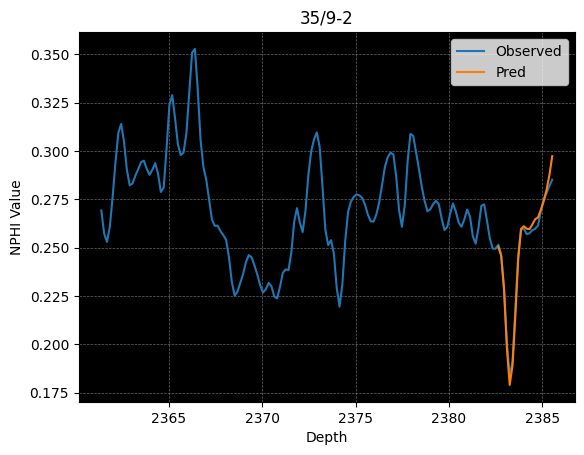

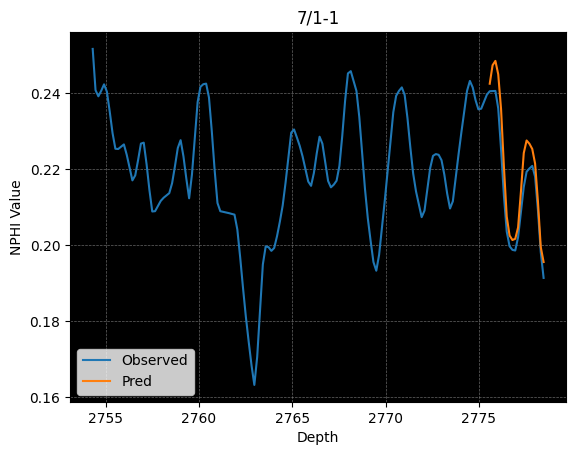

In [47]:
warnings.filterwarnings("ignore", category=UserWarning, module="lightning")
for well_name in well_names_list:
    X, Y,_ = pred_plot_df(well_name)
    
    # Create a new figure for each plot
    fig, ax = plt.subplots()
    
    # Plot the data on the axes
    ax.plot(X['NPHI'], label="Observed")
    ax.plot(Y, label="Pred")

    fig.set_facecolor('white')
    
    # Set the background color of the figure
    ax.set_facecolor('black')  # 
    
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)
    
    # Customize the plot title and legend
    ax.set_title(f"{well_name}")
    ax.legend()

    # Add labels to x-axis and y-axis
    ax.set_xlabel("Depth")  
    ax.set_ylabel("NPHI Value")  

    # Define the directory where you want to save the files
    save_directory = "/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Images/North Sea/NPHI/Validation/"

    # Create the directory if it doesn't exist
    os.makedirs(save_directory, exist_ok=True)
    
    s_well_name = well_name.replace('/', '_')

    # Generate the file name based on the well_name
    file_name = os.path.join(save_directory, f"validation-{s_well_name}.pdf")

    # Save the figure with the unique file name
    plt.savefig(file_name, format="pdf", bbox_inches="tight")

    # Show the plot
    plt.show()
warnings.resetwarnings()

In [48]:
warnings.filterwarnings("ignore")
# Compares the prediction against the actual for the entire validation dataset
predictions = best_tft.predict(val_dataloader, return_x=True,trainer_kwargs=dict(accelerator="cpu"))
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
#best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

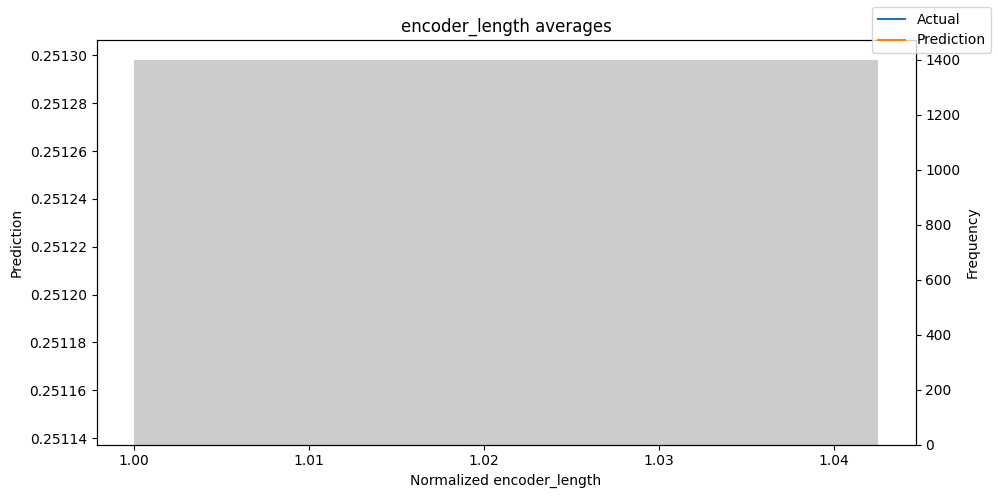

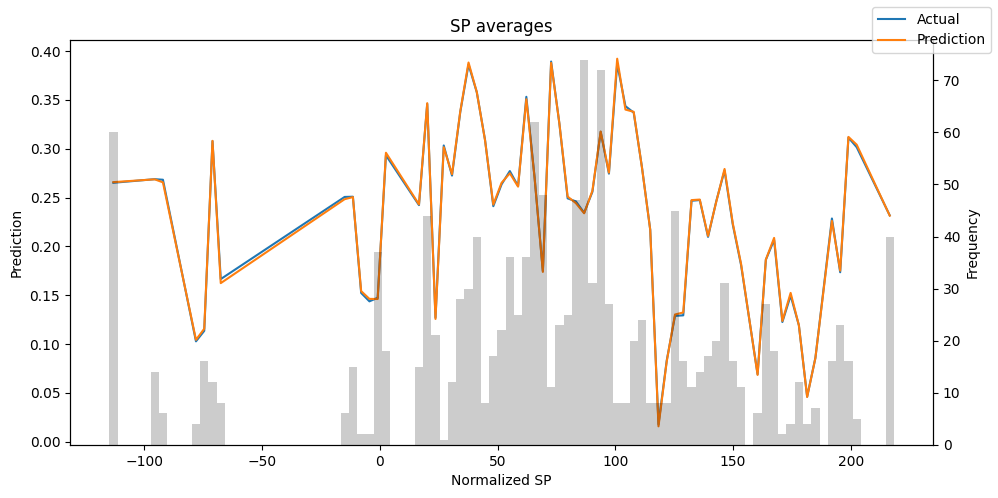

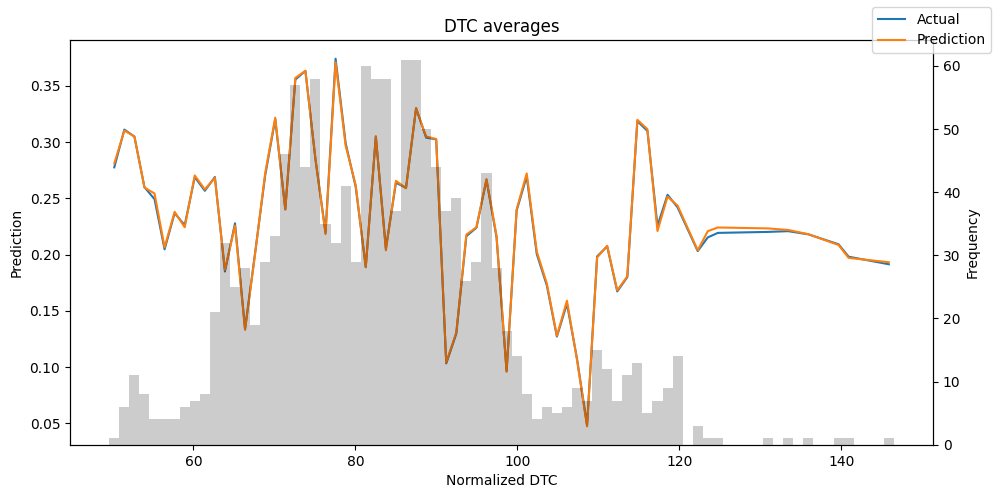

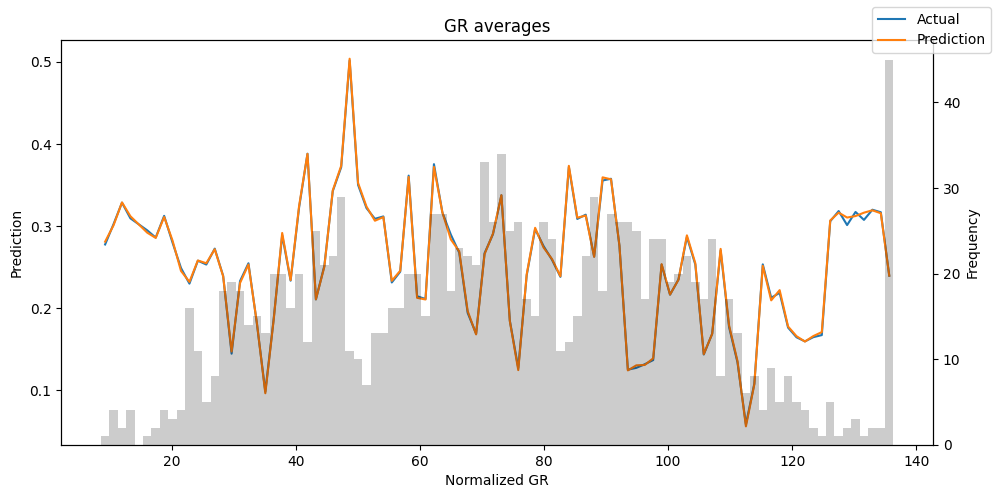

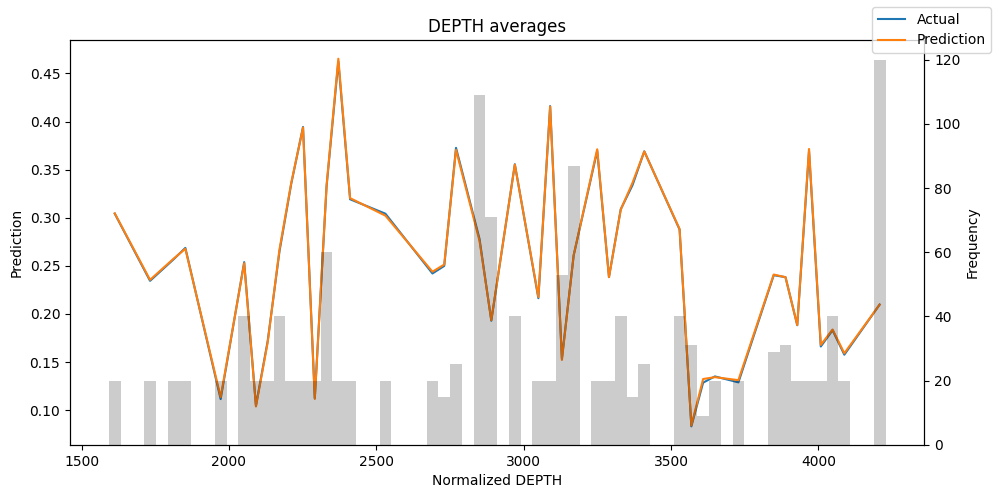

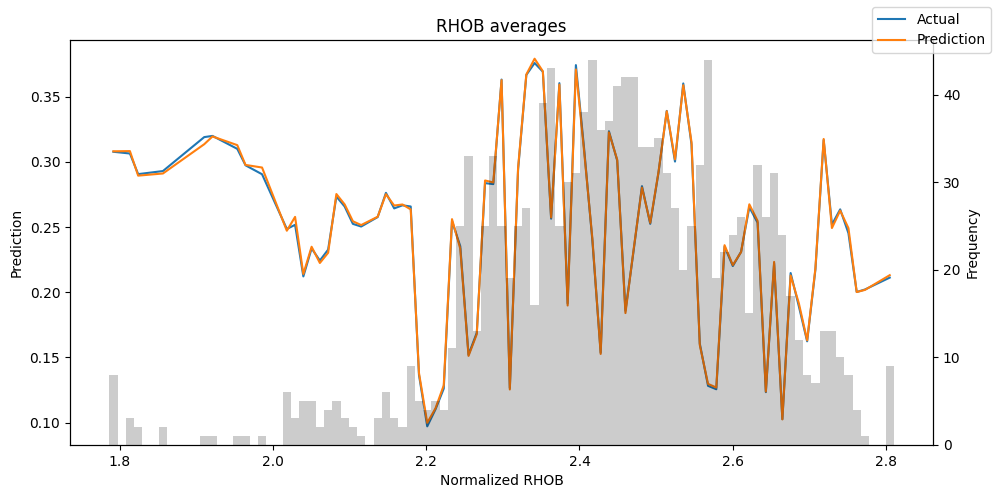

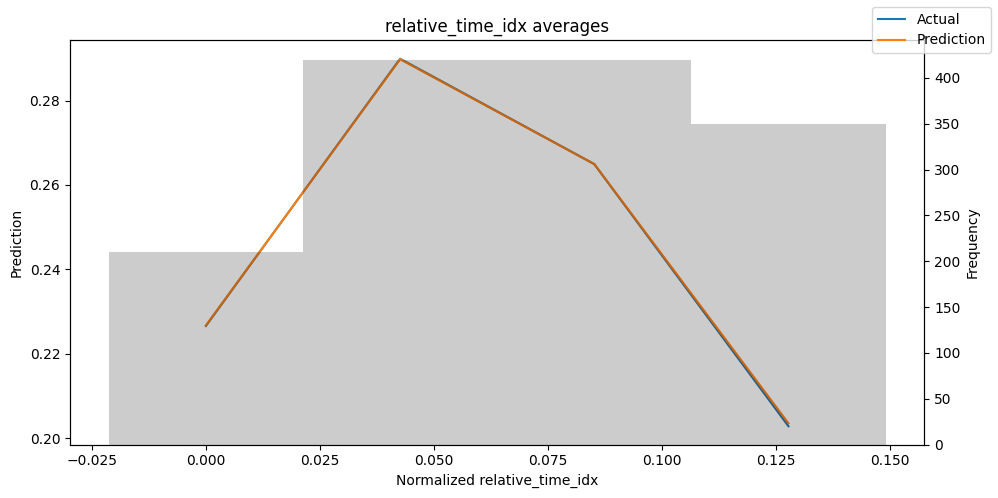

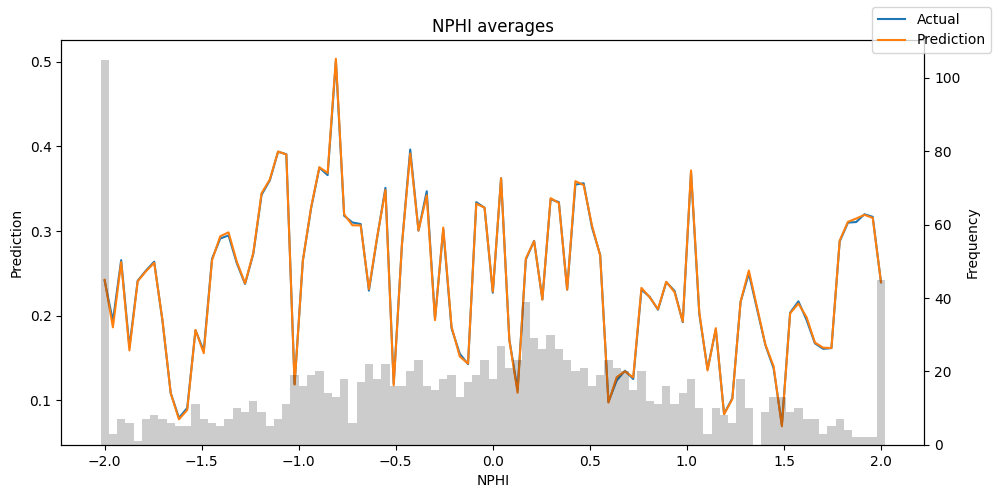

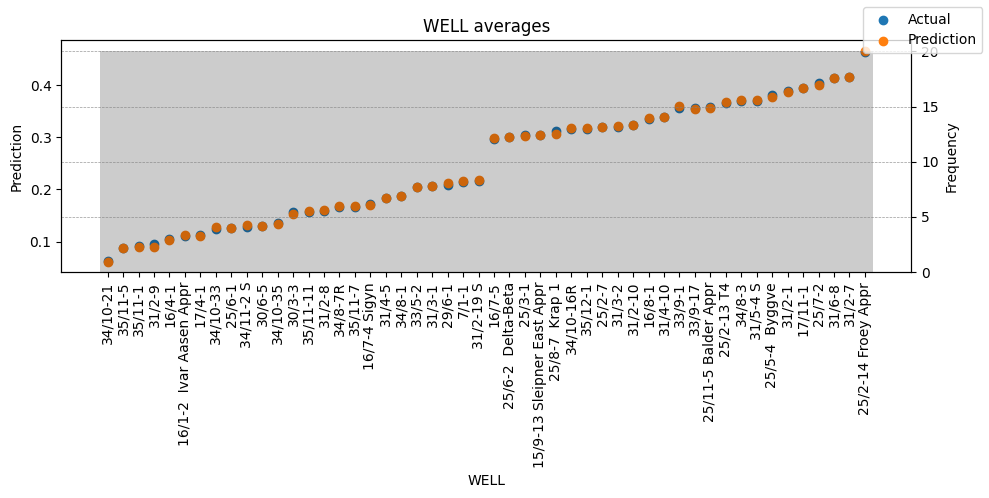

In [49]:
# Plot the data using the method provided by best_tft
fig = best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)

# Show the plot
plt.show()


### Testing Evaluation

In [50]:
warnings.filterwarnings("ignore")

test_actuals = torch.cat([y[0] for x, y in iter(test_dataloader)])
test_predictions = best_tft.predict(test_dataloader,trainer_kwargs=dict(accelerator="cpu"))

#average p50 loss overall
print((test_actuals - test_predictions).abs().mean().item())
#average p50 loss per time series
print((test_actuals - test_predictions).abs().mean(axis=1))

0.03588934987783432
tensor([0.0279, 0.0276, 0.0369, 0.0135, 0.0098, 0.0152, 0.0291, 0.0663, 0.0182,
        0.0638, 0.0185, 0.0094, 0.0377, 0.1152, 0.0298, 0.0349, 0.0536, 0.0816,
        0.0328, 0.0286, 0.0309, 0.0329, 0.0170, 0.0058, 0.0364, 0.0813, 0.1070,
        0.0295, 0.0436, 0.0220, 0.0248, 0.0329, 0.0120, 0.0322, 0.0350, 0.0146,
        0.0232, 0.0252, 0.0108, 0.0222, 0.0287, 0.0142, 0.0206, 0.0581, 0.0128,
        0.0151, 0.0440, 0.0108, 0.0109, 0.0303, 0.1006, 0.0410, 0.1619, 0.0244,
        0.0083, 0.1135, 0.0391, 0.0108, 0.0272, 0.1248, 0.0545, 0.0138, 0.0175,
        0.0325, 0.0120, 0.0173, 0.0251, 0.0321, 0.0068, 0.0137])


In [51]:
# Gets the number of unique wells
test_wells_len = len(train_wells['WELL'].unique())
print(test_wells_len)

# Retrieves a list of the well names
test_well_names_list = test_wells['WELL'].unique()
test_well_names_list[12]

70


'17/11-1'

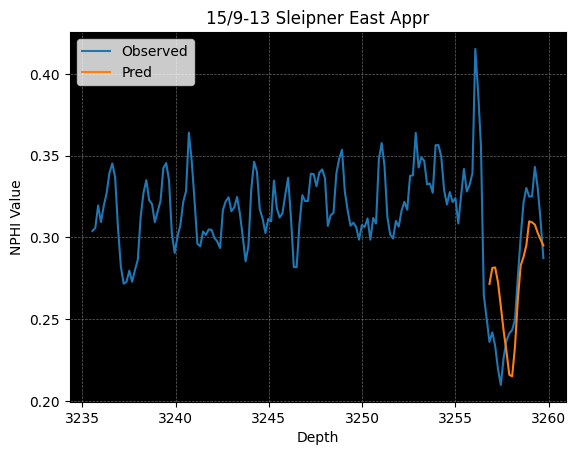

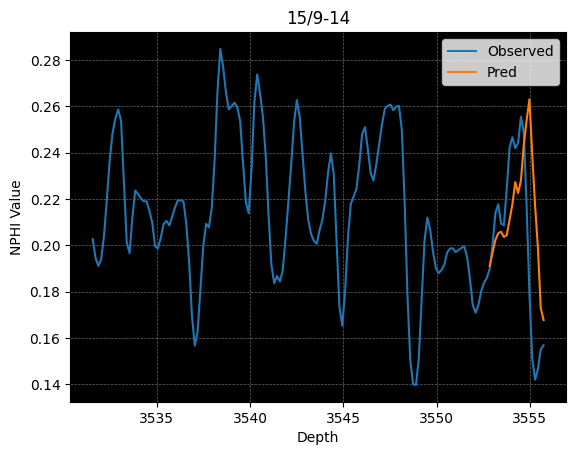

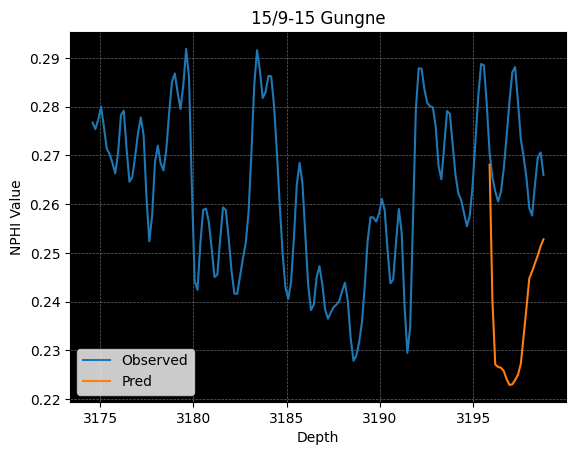

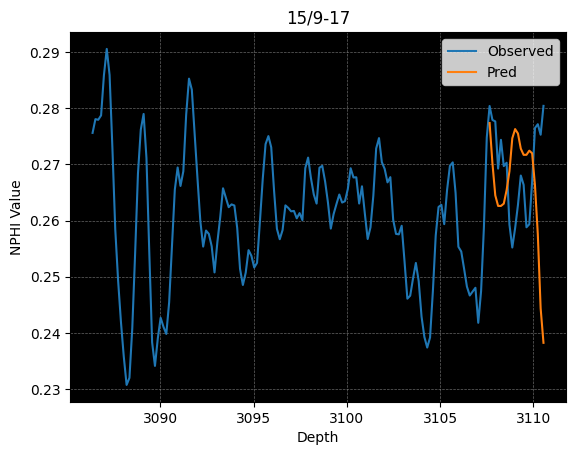

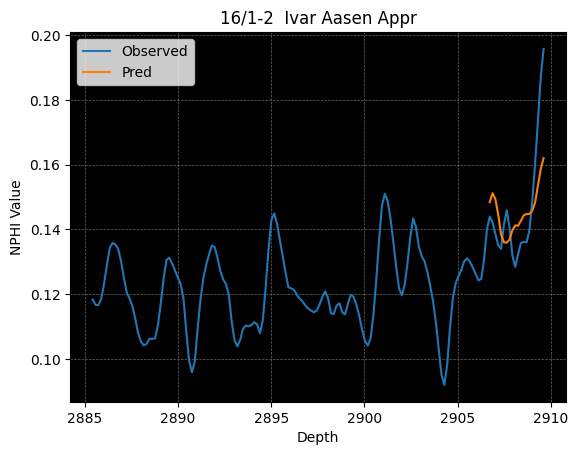

...

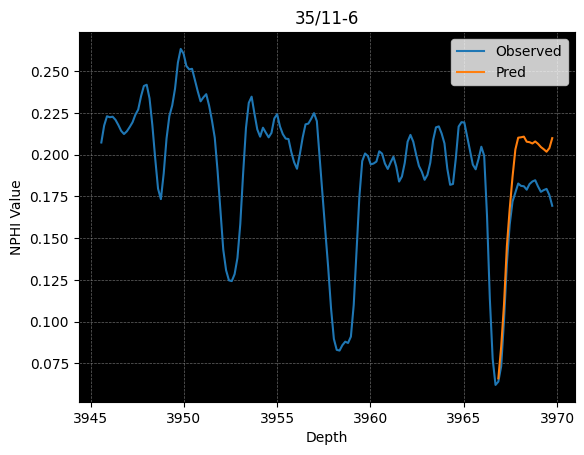

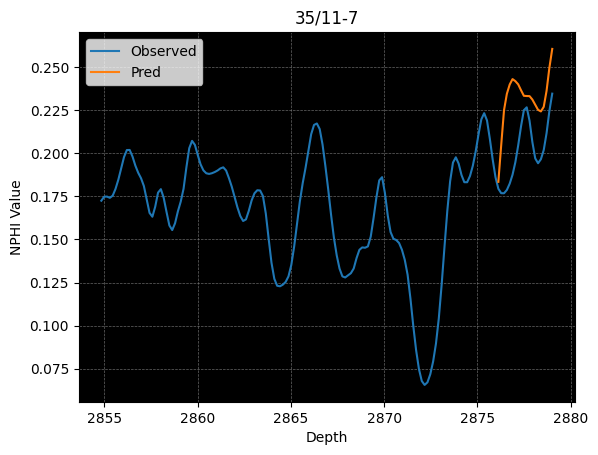

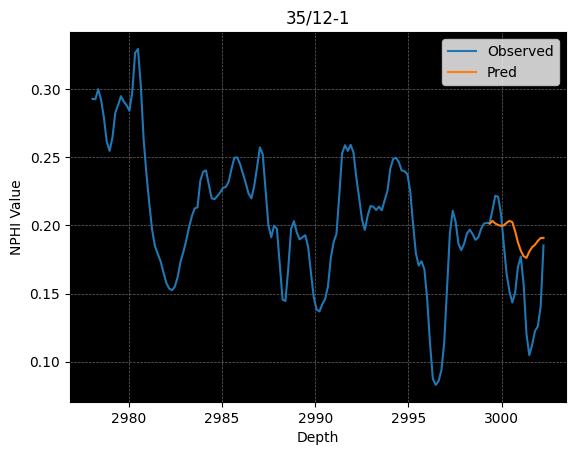

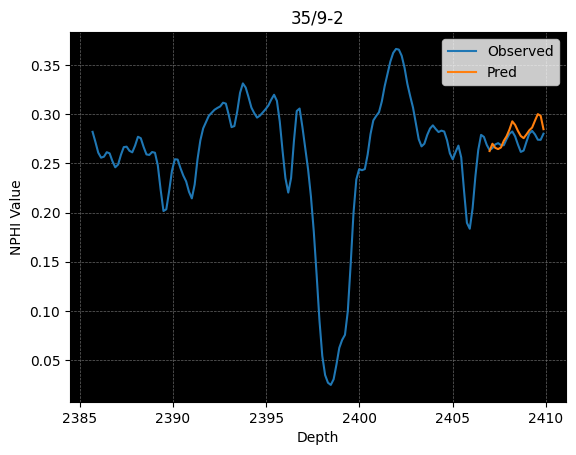

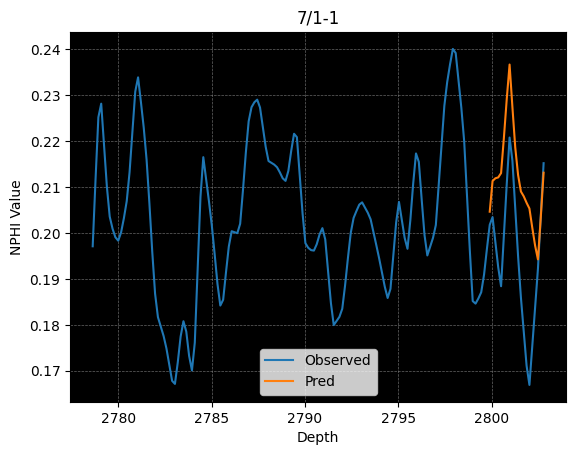

In [52]:
warnings.filterwarnings("ignore", category=UserWarning, module="lightning")
for well_name in well_names_list:
    X, Y,_ = pred_plot_df(well_name,well=test_wells, pred_data=testing)
    
    # Create a new figure for each plot
    fig, ax = plt.subplots()
    
    # Plot the data on the axes
    ax.plot(X['NPHI'], label="Observed")
    ax.plot(Y, label="Pred")

    fig.set_facecolor('white')
    
    # Set the background color of the figure
    ax.set_facecolor('black')  # 
    
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)
    
    # Customize the plot title and legend
    ax.set_title(f"{well_name}")
    ax.legend()

    # Add labels to x-axis and y-axis
    ax.set_xlabel("Depth")  
    ax.set_ylabel("NPHI Value")  

    # Define the directory where you want to save the files
    save_directory = "/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Images/North Sea/NPHI/Testing/"

    # Create the directory if it doesn't exist
    os.makedirs(save_directory, exist_ok=True)
    
    s_well_name = well_name.replace('/', '_')

    # Generate the file name based on the well_name
    file_name = os.path.join(save_directory, f"testing-{s_well_name}.pdf")

    # Save the figure with the unique file name
    plt.savefig(file_name, format="pdf", bbox_inches="tight")

    # Show the plot
    plt.show()
warnings.resetwarnings()

In [53]:
warnings.filterwarnings("ignore")
trainer.test(best_tft,test_dataloader);

Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_MAE          │    0.03588680177927017    │
│         test_MAPE         │    0.2253594994544983     │
│         test_RMSE         │   0.055306434631347656    │
│        test_SMAPE         │    0.1849498450756073     │
│         test_loss         │   0.028505617752671242    │
└───────────────────────────┴───────────────────────────┘

In [56]:
warnings.filterwarnings("ignore")
# Compares the prediction against the actual for the entire validation dataset
predictions = best_tft.predict(test_dataloader, return_x=True,trainer_kwargs=dict(accelerator="cpu"))
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(predictions.x, predictions.output)
#best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

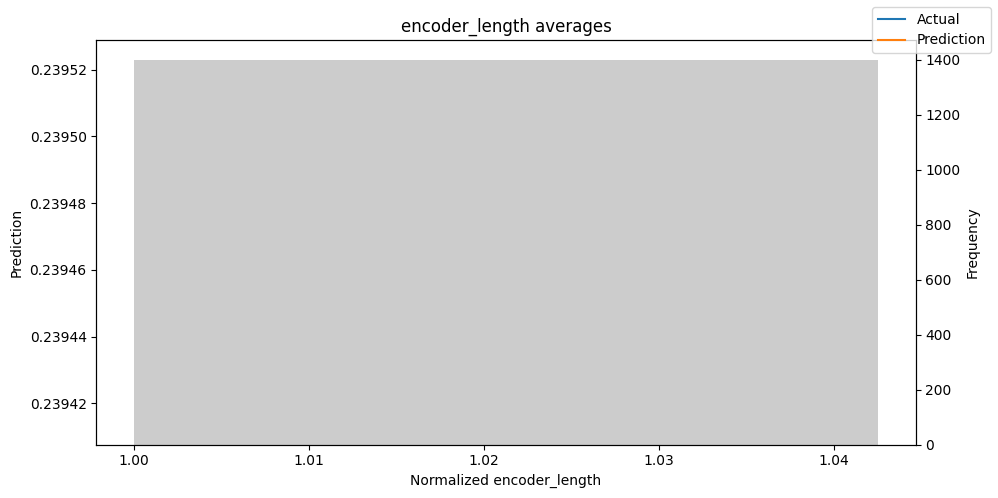

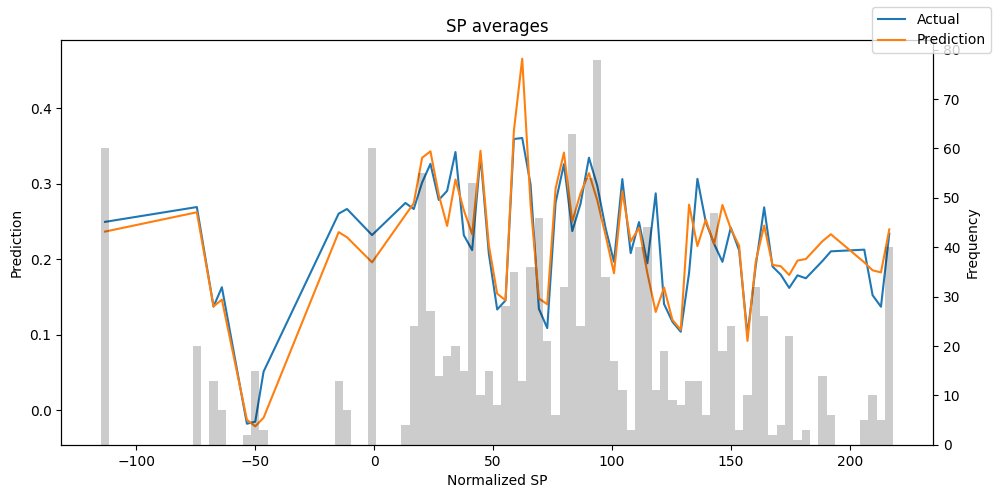

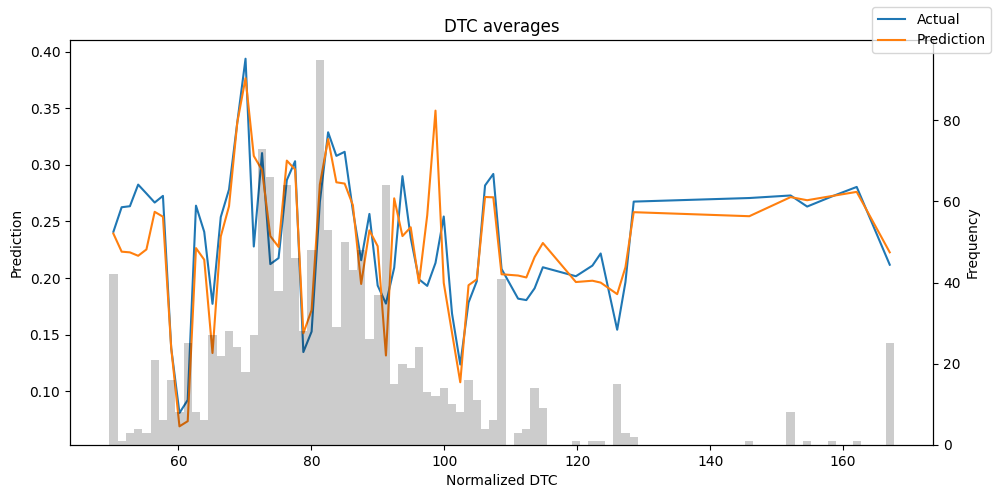

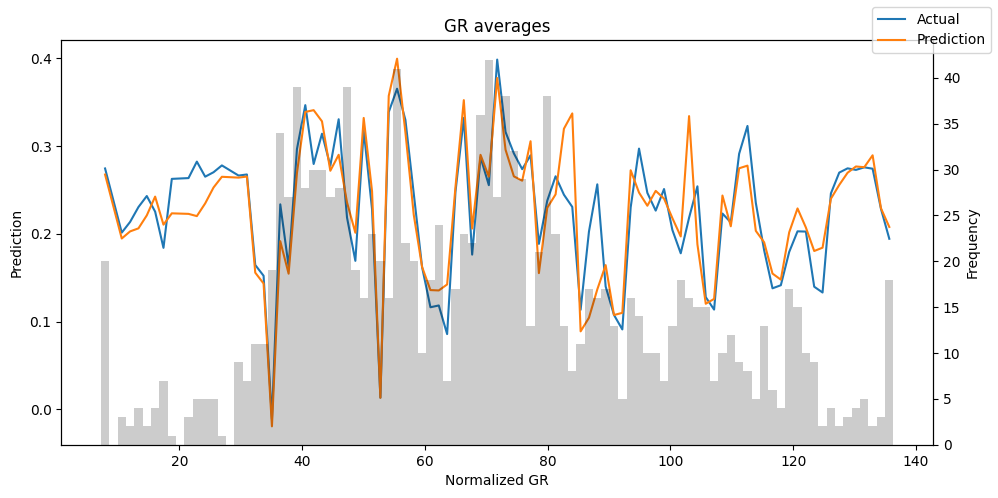

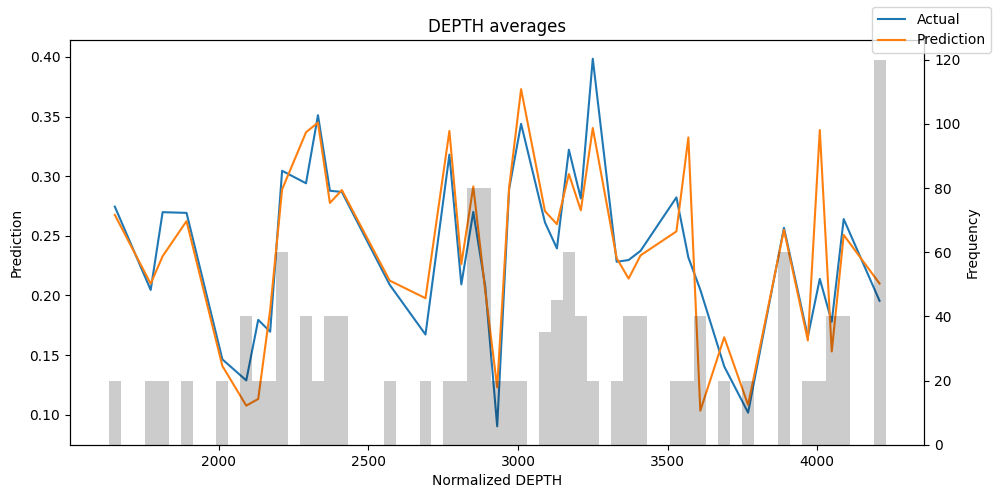

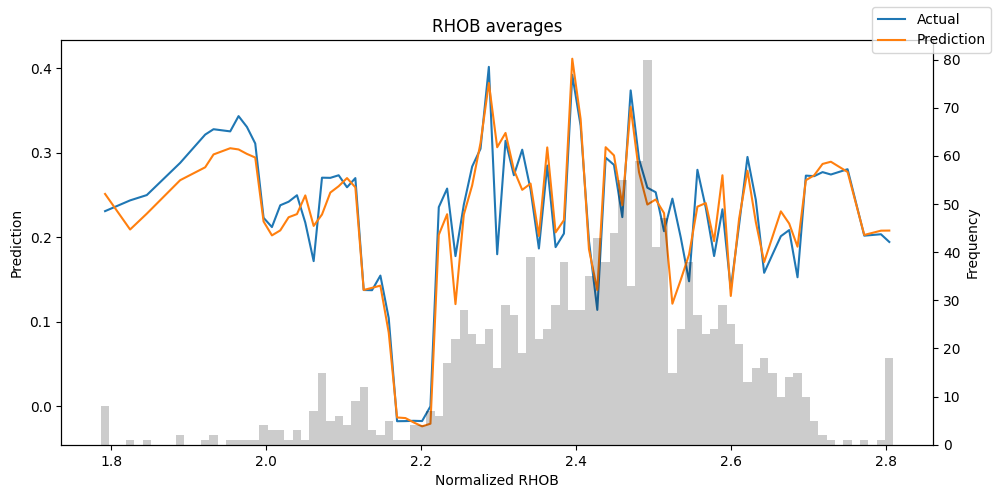

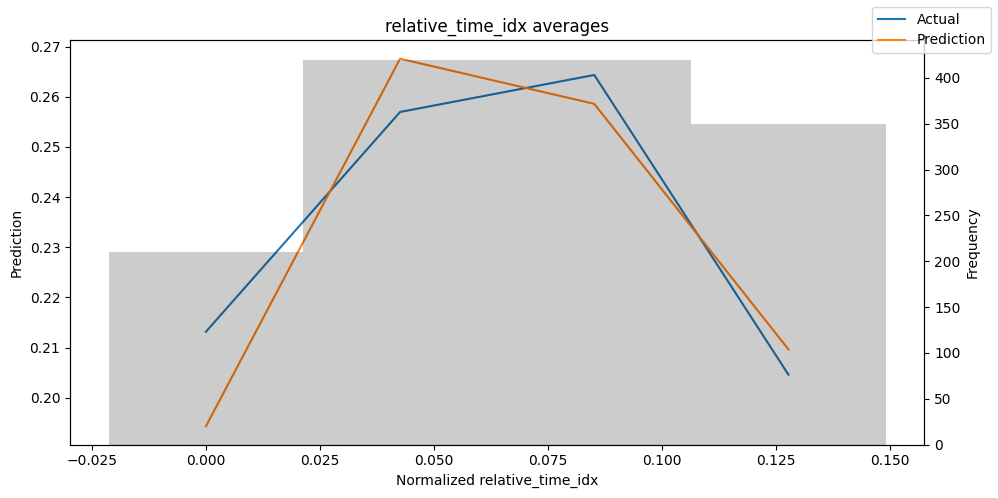

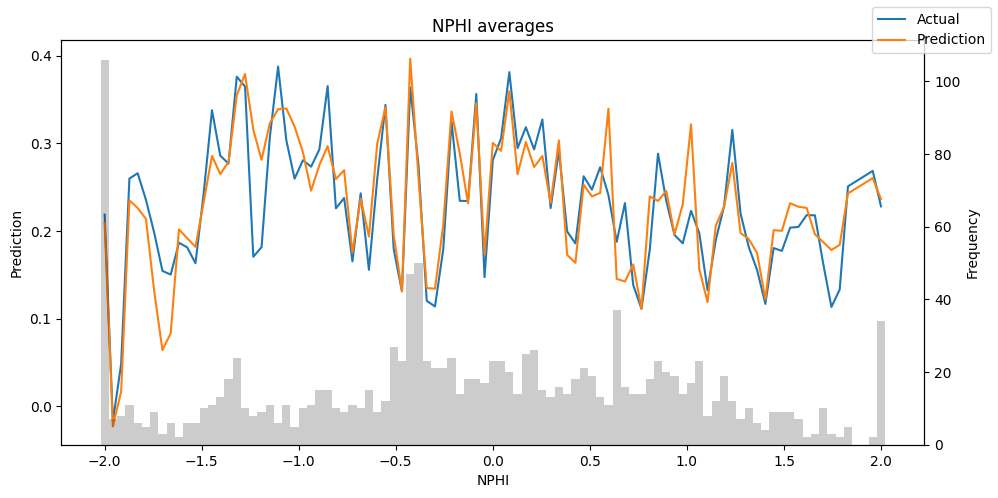

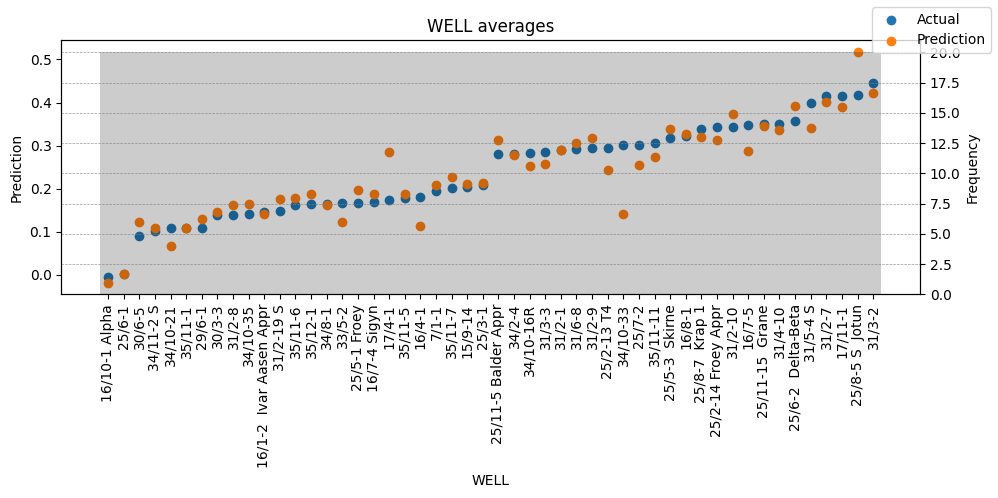

In [57]:
# Plot the data using the method provided by best_tft
fig = best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals)

plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)

# Show the plot
plt.show()


# Other Models

### Support Vector Machine

In [ ]:
# SVM Optimum hyperparameter search


# Splits training and testing dataset
wells_F = train_wells[["SP", "RHOB", "DTC", "GR"]]
wells_T = train_wells[["NPHI"]]

# Preprocessing: Scaling the data (important for SVMs)
scaler_X = StandardScaler()
scaler_Y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(wells_F)
y_train_scaled = scaler_Y.fit_transform(wells_T).ravel() # convert to 1D array

param_grid = {
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'C': [0.1, 1, 10, 100],
    'gamma': [0.01, 0.1, 1, 'scale', 'auto'],
    'degree': [2, 3, 4, 5]  # only used by the 'poly' kernel
}

grid_search = GridSearchCV(SVR(), param_grid, cv=2, verbose=1, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_svr = grid_search.best_estimator_

In [ ]:
best_svr

In [37]:
def SVM(well_name, train_well=train_wells, test_well=test_wells, kernel="sigmoid", C=100, Gamma=0.01, degree=2):
    
    # Creates a dataframe containing just the selected well
    train_well_df = train_well[train_well["WELL"] == well_name]
    test_well_df = test_well[test_well["WELL"] == well_name]

    # Splitting the well data into training and testing datasets
    train_wells_F = train_well_df[["SP", "RHOB", "DTC", "GR"]]
    train_wells_T = train_well_df[["NPHI"]]
    test_wells_F = test_well_df[["SP", "RHOB", "DTC", "GR"]]
    test_wells_T = test_well_df[["NPHI"]]

    # Scaling the data
    scaler_X = StandardScaler()
    scaler_Y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(train_wells_F)
    X_test_scaled = scaler_X.transform(test_wells_F)

    y_train_scaled = scaler_Y.fit_transform(train_wells_T).ravel()
    y_test_scaled = scaler_Y.transform(test_wells_T).ravel()

    # Training the SVM Regressor
    svr = SVR(kernel=kernel, C=C, gamma=Gamma, degree=degree)
    svr.fit(X_train_scaled, y_train_scaled)

    # Making Predictions
    y_pred_scaled = svr.predict(X_test_scaled)
    y_pred = scaler_Y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    # Evaluating the Model
    mse = mean_squared_error(test_wells_T, y_pred)

    # Return the last twenty predicted NPHI values
    y = y_pred[-20:]

    return y, mse

### Random Forest

In [38]:
def RF(well_name, train_well=train_wells, test_well=test_wells):
    
    # Creates a dataframe containing just the selected well
    train_well_df = train_well[train_well["WELL"] == well_name]
    test_well_df = test_well[test_well["WELL"] == well_name]

    # Splitting the well data into training and testing datasets
    train_wells_F = train_well_df[["SP", "RHOB", "DTC", "GR"]]
    train_wells_T = train_well_df[["NPHI"]]
    test_wells_F = test_well_df[["SP", "RHOB", "DTC", "GR"]]
    test_wells_T = test_well_df[["NPHI"]]

    # Preprocessing: Scaling the data 
    scaler_X = StandardScaler()
    scaler_Y = StandardScaler()
    
    X_train_scaled = scaler_X.fit_transform(train_wells_F)
    X_test_scaled = scaler_X.transform(test_wells_F)

    y_train_scaled = scaler_Y.fit_transform(train_wells_T).ravel() # ravel to convert to 1D array
    y_test_scaled = scaler_Y.transform(test_wells_T).ravel()
    
    feature_importance = []

    # Create and train the random forest regressor
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train_scaled, y_train_scaled)
    
    # Making Predictions
    y_pred_scaled = rf.predict(X_test_scaled)
    y_pred = scaler_Y.inverse_transform(y_pred_scaled.reshape(-1, 1))
    
    # Calculate the mean squared error for the predictions
    mse = mean_squared_error(test_wells_T, y_pred)
    #print(f"Mean Squared Error: {mse}")
    
    # check feature importances
    importances = rf.feature_importances_
    for feature, importance in zip(wells.columns, importances):
        feature_importance.append(f"{feature}: {importance}")

    # Return the last twenty predicted NPHI values
    y = y_pred[-20:]
    
    return y, mse, feature_importance

### XG BOOST

In [39]:
# Optimum Hyperparameter grid search

# Splits training and testing dataset
wells_F = train_wells[["SP", "RHOB", "DTC", "GR"]]
wells_T = train_wells[["NPHI"]]

# Preprocessing: Scaling the data (important for SVMs)
scaler_X = StandardScaler()
scaler_Y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(wells_F)
y_train_scaled = scaler_Y.fit_transform(wells_T).ravel() # ravel to convert to 1D array

# Suppress future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# Define the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
# Define the hyperparameters and their search space
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [50, 100, 200],
}

# Define the scoring metric for optimization
scoring = make_scorer(lambda y_true, y_pred: mean_squared_error(y_true, y_pred, squared=False), greater_is_better=False)

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring=scoring, cv=3, verbose=2, n_jobs=-1)

# Fit the GridSearchCV to your data
grid_search.fit(X_train_scaled, y_train_scaled)

# Get the best hyperparameters and the corresponding model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:")
print(best_params)

NameError: name 'make_scorer' is not defined

In [40]:
def XGB(well_name, train_well=train_wells, test_well=test_wells):

        # Creates a dataframe containing just the selected well
    train_well_df = train_well[train_well["WELL"] == well_name]
    test_well_df = test_well[test_well["WELL"] == well_name]

    # Splitting the well data into training and testing datasets
    train_wells_F = train_well_df[["SP", "RHOB", "DTC", "GR"]]
    train_wells_T = train_well_df[["NPHI"]]
    test_wells_F = test_well_df[["SP", "RHOB", "DTC", "GR"]]
    test_wells_T = test_well_df[["NPHI"]]
    
    # Preprocessing: Scaling the data (important for SVMs)
    scaler_X = StandardScaler()
    scaler_Y = StandardScaler()
    
    X_train_scaled = scaler_X.fit_transform(train_wells_F)
    X_test_scaled = scaler_X.transform(test_wells_F)

    y_train_scaled = scaler_Y.fit_transform(train_wells_T).ravel() # ravel to convert to 1D array
    y_test_scaled = scaler_Y.transform(test_wells_T).ravel()
    
    # Suppress future warnings
    warnings.simplefilter(action='ignore', category=FutureWarning)

    # Convert data into DMatrix format for XGBoost
    dtrain = xgb.DMatrix(X_train_scaled, label=y_train_scaled)
    dtest = xgb.DMatrix(X_test_scaled, label=y_test_scaled)

    # Define parameters for the XGBoost model
    param = {
    'max_depth': 4,  # the maximum depth of each tree
    'eta': 0.3,  # the training step for each iteration
    'objective': 'reg:squarederror',  # error function for regression
    'eval_metric': 'rmse',  # evaluation metric for regression
    }
    
    # Specify validation set for performance monitoring
    evallist = [(dtest, 'eval'), (dtrain, 'train')]
    
    # Train the model
    num_round = 100  # number of boosting rounds
    bst = xgb.train(param, dtrain, num_round, evallist, verbose_eval=False)
    
    # Predict the test set
    y_pred_scaled = bst.predict(dtest)
    y_pred = scaler_Y.inverse_transform(y_pred_scaled.reshape(-1, 1))
    
    # Calculate RMSE
    rmse = mean_squared_error(test_wells_T, y_pred, squared=False)

    # Return the last twenty predicted NPHI values
    y = y_pred[-20:]
    
    return y, rmse

### Conv.BiLSTM

In [41]:
def Conv_BiLSTM(well_name, train_well=train_wells, test_well=test_wells):
    seed = 42  
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

    # Create DataFrames containing just the selected well from training and testing datasets
    train_well_df = train_well[train_well["WELL"] == well_name]
    test_well_df = test_well[test_well["WELL"] == well_name]

    # Extracting features and target from DataFrames as numpy arrays
    train_wells_F = np.array(train_well_df[["SP", "RHOB", "DTC", "GR"]], dtype=np.float32)
    train_wells_T = np.array(train_well_df[["NPHI"]], dtype=np.float32)
    test_wells_F = np.array(test_well_df[["SP", "RHOB", "DTC", "GR"]], dtype=np.float32)
    test_wells_T = np.array(test_well_df[["NPHI"]], dtype=np.float32)

    class LSTM(nn.Module):
        def __init__(self, in_size=4, n_hidden=60):
            super(LSTM, self).__init__()
            self.hidden = n_hidden
            self.conv1 = nn.Conv1d(in_channels=in_size, out_channels=16, kernel_size=3, stride=1, padding=1)
            self.relu = nn.ReLU()
            self.lstm = nn.LSTM(input_size=16, hidden_size=self.hidden, num_layers=4, bidirectional=True)
            self.fc = nn.Linear(self.hidden * 2, 1)  # times 2 because of bidirectional
    
        def forward(self, x):
            x = self.conv1(x.transpose(1, 2))
            x = self.relu(x).transpose(1, 2)
            lstm_out, _ = self.lstm(x)
            return self.fc(lstm_out).squeeze(1)
    
    # Convert data to PyTorch tensors
    wells_Features_tensor = torch.tensor(train_wells_F, dtype=torch.float32)
    wells_Target_tensor = torch.tensor(train_wells_T, dtype=torch.float32)
    
    # Create DataLoader for batching
    batch_size = 140
    train_dataset = TensorDataset(wells_Features_tensor, wells_Target_tensor)  
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = LSTM().to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    losses = []
    n_epochs = 200
    
    for epoch in range(n_epochs):
        model.train()
        total_loss = 0
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.unsqueeze(1)  # This ensures the shape (sequence_length, batch_size, input_size)
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
        avg_loss = total_loss / len(train_loader)
        losses.append(avg_loss)  # Store the average loss for this epoch

    # Convert test data to PyTorch tensors
    test_Features_tensor = torch.tensor(test_wells_F, dtype=torch.float32).unsqueeze(1).to(device)
    
    # Set the model to evaluation mode
    model.eval()
    
    # Make predictions
    with torch.no_grad():
        predictions = model(test_Features_tensor)
    
    # Convert predictions to numpy
    y_pred = predictions.cpu().numpy()
    
    # Calculate RMSE
    rmse = mean_squared_error(test_wells_T, y_pred, squared=False)

    # Return the last twenty predicted NPHI values
    y = y_pred[-20:]

    return y, rmse, losses


In [42]:
_,_,L =Conv_BiLSTM("17/11-1")

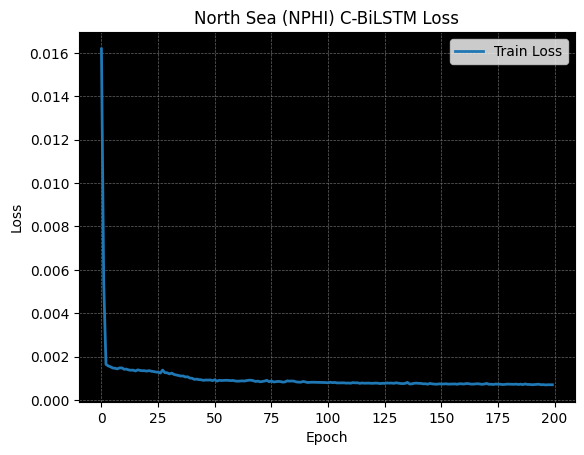

In [43]:
# Create a new figure with a dark background
fig, ax = plt.subplots()
fig.set_facecolor('white')
ax.set_facecolor('black')

plt.plot(L, linewidth=2, label= "Train Loss");

# Add labels to x-axis and y-axis (customize as needed)
ax.set_xlabel("Epoch", color='black')
ax.set_ylabel("Loss", color='black')

# Customize other plot properties (title, grid, etc.)
ax.set_title("North Sea (NPHI) C-BiLSTM Loss", color='black', fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)

# Customize tick labels and colors
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')

plt.legend(loc="upper right")

plt.savefig("/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Images/North Sea/NPHI/C-BiLSTM Loss.pdf", format="pdf", bbox_inches="tight") # Saves the figure


# Show the plot
plt.show()

### Combined Test Outcomes

In [44]:
# Helper function to correct the index of predictions
def fix_index(data, index):
    data_df = pd.DataFrame(data)
    index = index[-20:]
    data_df["pred_index"]=index
    data_df.set_index("pred_index", inplace=True)

    return data_df

In [ ]:
y_CBLSTM, _, loss = Conv_BiLSTM(well_name)


In [ ]:
len(y_CBLSTM)

In [ ]:
y_CBLSTM_df = fix_index(y_CBLSTM, pred_index)

In [ ]:
y_SVM_df

In [ ]:
random_num = random.randint(0,len(well_names_list))
well_name = well_names_list[random]
well_name

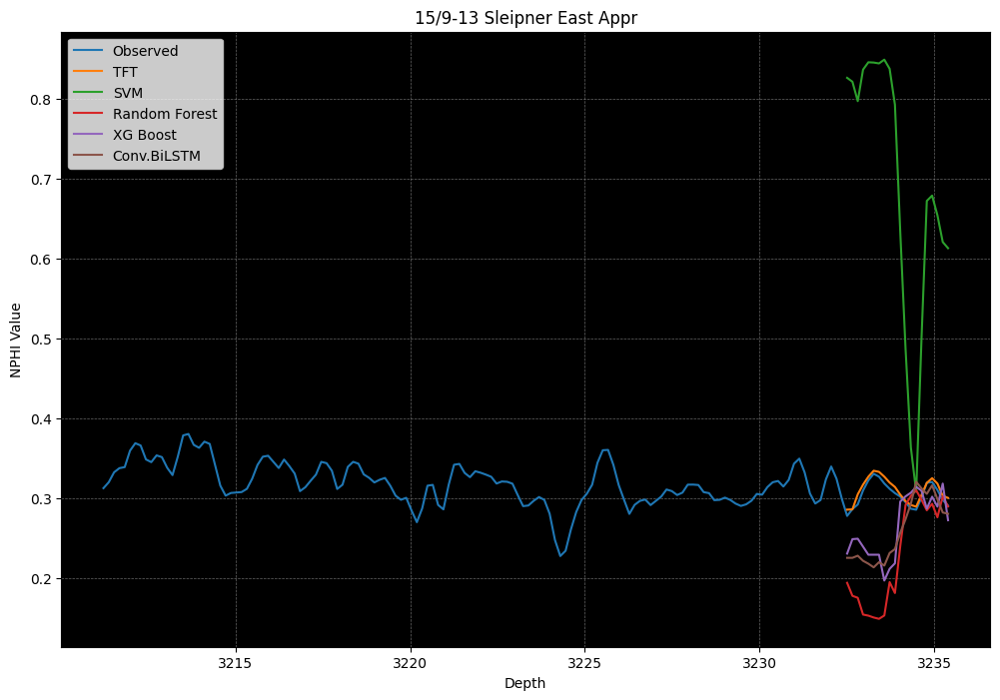

In [46]:
# Loop over each well_name
for well_name in ["15/9-13 Sleipner East Appr"]: #well_names_list:
    # Ignore UserWarnings during plotting
    warnings.filterwarnings("ignore", category=UserWarning, module="lightning")

    # TFT and true prediction depth index
    X, Y, pred_index = pred_plot_df(well_name)

    # SVM
    y_SVM, _ = SVM(well_name)
    y_SVM_df = fix_index(y_SVM, pred_index)

    # Random Forest
    y_rand_F, _, _ = RF(well_name)
    y_rand_F_df = fix_index(y_rand_F, pred_index)

    # XG Boost
    y_xgb, _ = XGB(well_name)
    y_xgb_df = fix_index(y_xgb, pred_index)

    # Conv.BiLSTM
    y_CBLSTM, _, loss = Conv_BiLSTM(well_name)
    y_CBLSTM_df = fix_index(y_CBLSTM, pred_index)

    # Create a new figure for each plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot the data on the axes
    ax.plot(X['NPHI'][-140:], label="Observed")
    ax.plot(Y, label="TFT")
    ax.plot(y_SVM_df, label="SVM")
    ax.plot(y_rand_F_df, label="Random Forest")
    ax.plot(y_xgb_df, label="XG Boost")
    ax.plot(y_CBLSTM_df, label="Conv.BiLSTM")
    
    fig.set_facecolor('white')
    
    # Set the background color of the figure
    ax.set_facecolor('black')
    
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.8)
    
    # Customize the plot title and legend
    ax.set_title(f"{well_name}")
    ax.legend()
    
    # Add labels to x-axis and y-axis
    ax.set_xlabel("Depth")
    ax.set_ylabel("NPHI Value")
    
    # Define the directory where you want to save the files
    save_directory = "/home/g202216220/Desktop/TFT/TFT_LOGS-20230930T093740Z-001/TFT_LOGS/Images/North Sea/NPHI/Combined/"
    
    # Create the directory if it doesn't exist
    os.makedirs(save_directory, exist_ok=True)
    
    # Save the figure with a unique file name
    s_well_name = well_name.replace('/', '_')
    file_name = os.path.join(save_directory, f"combined-{s_well_name}.pdf")
    plt.savefig(file_name, format="pdf", bbox_inches="tight")
    
    # Reset warnings
    warnings.resetwarnings()
    
    # Show the plot 
    plt.show()